In [1]:
import findspark
findspark.init('/home/ubuntu/spark-2.1.1-bin-hadoop2.7')
import pyspark
from pyspark.sql import SparkSession
spark = SparkSession.builder.appName('BDAS').getOrCreate()

In [2]:
dataset = spark.read.csv('Life Expectancy Data.csv', inferSchema=True, header=True)
dataset.printSchema()

root
 |-- Country: string (nullable = true)
 |-- Year: integer (nullable = true)
 |-- Status: string (nullable = true)
 |-- Life expectancy : double (nullable = true)
 |-- Adult Mortality: integer (nullable = true)
 |-- infant deaths: integer (nullable = true)
 |-- Alcohol: double (nullable = true)
 |-- percentage expenditure: double (nullable = true)
 |-- Hepatitis B: integer (nullable = true)
 |-- Measles : integer (nullable = true)
 |--  BMI : double (nullable = true)
 |-- under-five deaths : integer (nullable = true)
 |-- Polio: integer (nullable = true)
 |-- Total expenditure: double (nullable = true)
 |-- Diphtheria : integer (nullable = true)
 |--  HIV/AIDS: double (nullable = true)
 |-- GDP: double (nullable = true)
 |-- Population: double (nullable = true)
 |--  thinness  1-19 years: double (nullable = true)
 |--  thinness 5-9 years: double (nullable = true)
 |-- Income composition of resources: double (nullable = true)
 |-- Schooling: double (nullable = true)



In [3]:
dataset.show()

+-----------+----+----------+----------------+---------------+-------------+-------+----------------------+-----------+--------+-----+------------------+-----+-----------------+-----------+---------+------------+-----------+---------------------+-------------------+-------------------------------+---------+
|    Country|Year|    Status|Life expectancy |Adult Mortality|infant deaths|Alcohol|percentage expenditure|Hepatitis B|Measles | BMI |under-five deaths |Polio|Total expenditure|Diphtheria | HIV/AIDS|         GDP| Population| thinness  1-19 years| thinness 5-9 years|Income composition of resources|Schooling|
+-----------+----+----------+----------------+---------------+-------------+-------+----------------------+-----------+--------+-----+------------------+-----+-----------------+-----------+---------+------------+-----------+---------------------+-------------------+-------------------------------+---------+
|Afghanistan|2015|Developing|            65.0|            263|           

In [4]:
print((dataset.count(), len(dataset.columns)))

(2938, 22)


In [5]:
dataset.describe().show()

+-------+-----------+------------------+----------+-----------------+------------------+------------------+------------------+----------------------+------------------+------------------+------------------+------------------+------------------+------------------+-----------------+------------------+------------------+--------------------+---------------------+-------------------+-------------------------------+------------------+
|summary|    Country|              Year|    Status| Life expectancy |   Adult Mortality|     infant deaths|           Alcohol|percentage expenditure|       Hepatitis B|          Measles |              BMI |under-five deaths |             Polio| Total expenditure|      Diphtheria |          HIV/AIDS|               GDP|          Population| thinness  1-19 years| thinness 5-9 years|Income composition of resources|         Schooling|
+-------+-----------+------------------+----------+-----------------+------------------+------------------+------------------+------

In [6]:
dataset.dtypes

[('Country', 'string'),
 ('Year', 'int'),
 ('Status', 'string'),
 ('Life expectancy ', 'double'),
 ('Adult Mortality', 'int'),
 ('infant deaths', 'int'),
 ('Alcohol', 'double'),
 ('percentage expenditure', 'double'),
 ('Hepatitis B', 'int'),
 ('Measles ', 'int'),
 (' BMI ', 'double'),
 ('under-five deaths ', 'int'),
 ('Polio', 'int'),
 ('Total expenditure', 'double'),
 ('Diphtheria ', 'int'),
 (' HIV/AIDS', 'double'),
 ('GDP', 'double'),
 ('Population', 'double'),
 (' thinness  1-19 years', 'double'),
 (' thinness 5-9 years', 'double'),
 ('Income composition of resources', 'double'),
 ('Schooling', 'double')]

In [7]:
dataset.columns

['Country',
 'Year',
 'Status',
 'Life expectancy ',
 'Adult Mortality',
 'infant deaths',
 'Alcohol',
 'percentage expenditure',
 'Hepatitis B',
 'Measles ',
 ' BMI ',
 'under-five deaths ',
 'Polio',
 'Total expenditure',
 'Diphtheria ',
 ' HIV/AIDS',
 'GDP',
 'Population',
 ' thinness  1-19 years',
 ' thinness 5-9 years',
 'Income composition of resources',
 'Schooling']

In [8]:
dataset.head()

Row(Country='Afghanistan', Year=2015, Status='Developing', Life expectancy =65.0, Adult Mortality=263, infant deaths=62, Alcohol=0.01, percentage expenditure=71.27962362, Hepatitis B=65, Measles =1154,  BMI =19.1, under-five deaths =83, Polio=6, Total expenditure=8.16, Diphtheria =65,  HIV/AIDS=0.1, GDP=-584.25921, Population=33736494.0,  thinness  1-19 years=17.2,  thinness 5-9 years=17.3, Income composition of resources=0.479, Schooling=10.1)

In [17]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns

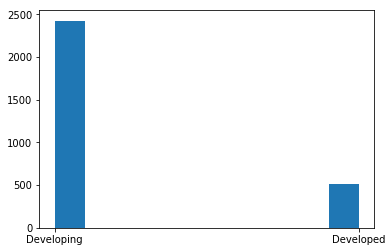

In [11]:
statusArr = np.array(dataset.select('Status').collect())
plt.hist(statusArr)
plt.show()

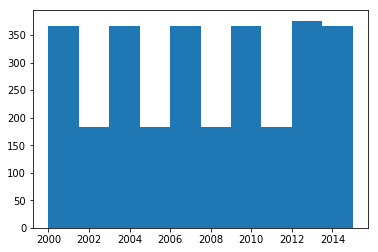

In [12]:
yearArr = np.array(dataset.select('Year').collect())
plt.hist(yearArr)
plt.show()

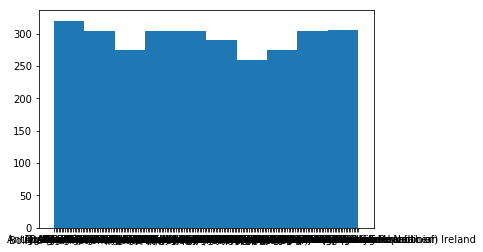

In [13]:
countryArr = np.array(dataset.select('Country').collect())
plt.hist(countryArr)
plt.show()

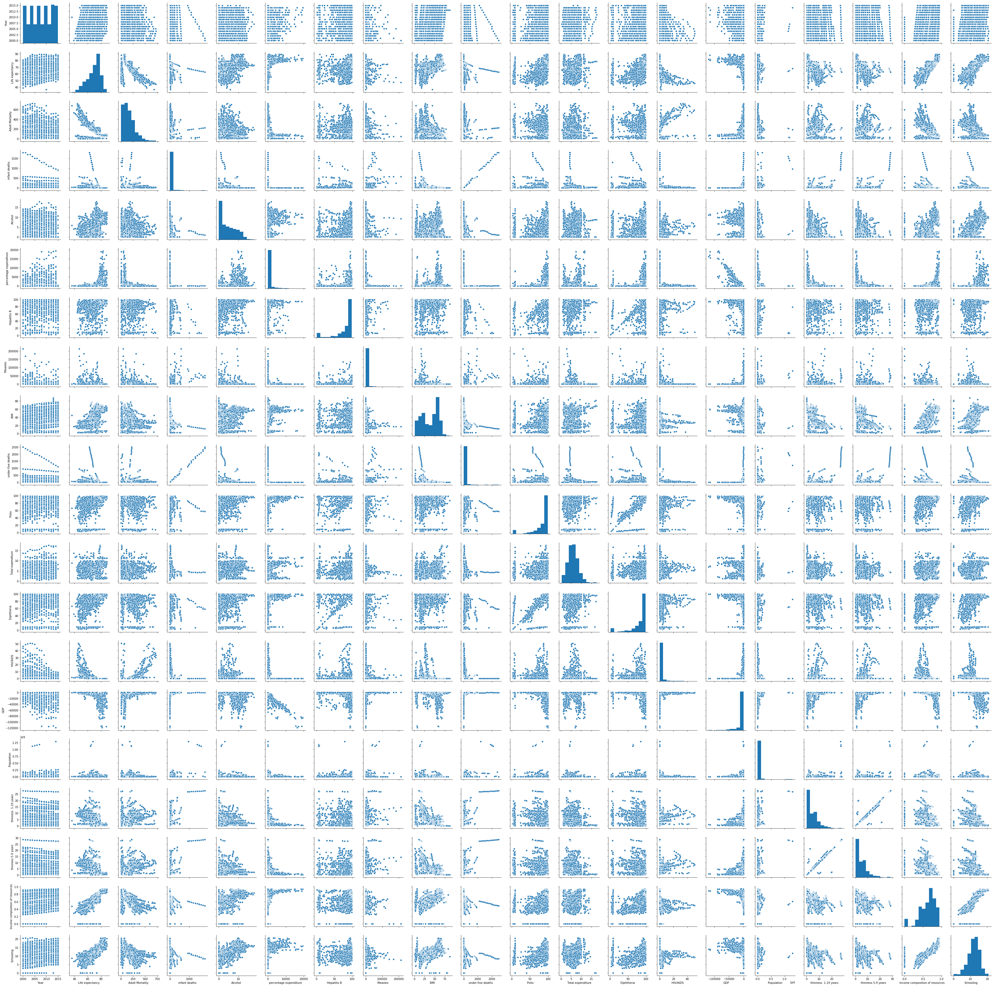

In [14]:
dataset=dataset.toPandas()
sns.pairplot(dataset)

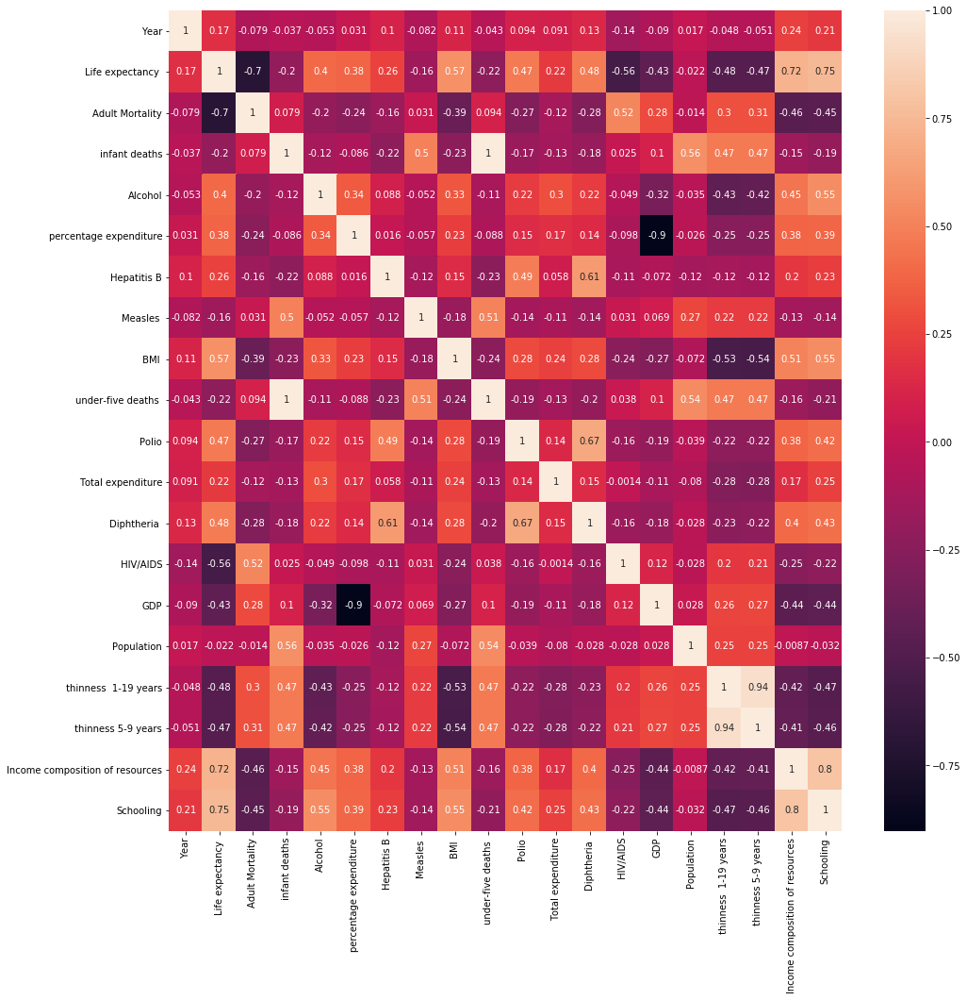

In [15]:
plt.figure(figsize=(16,16))
cor = sns.heatmap(dataset.corr(), annot = True)
plt.show()

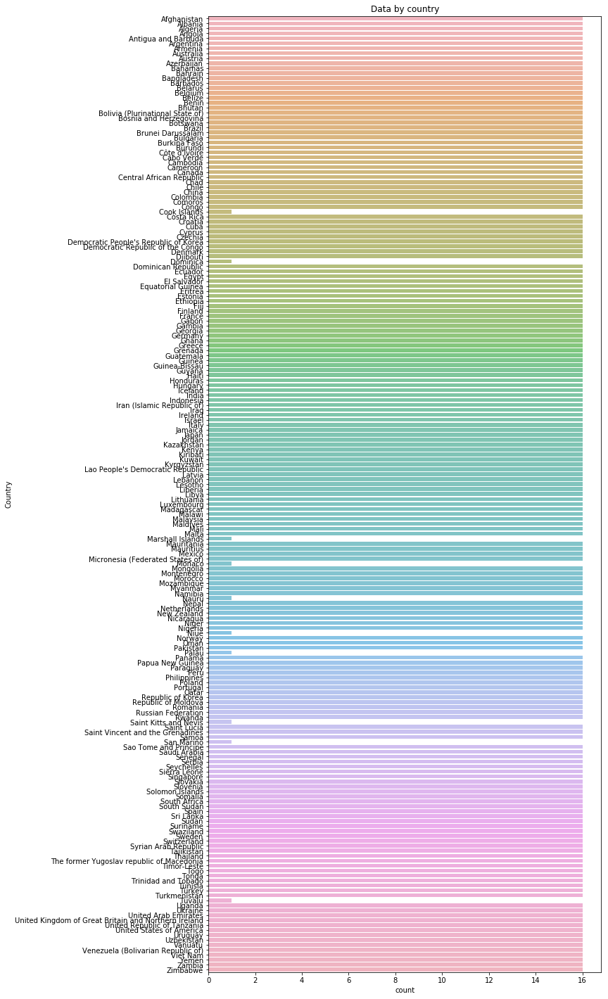

In [16]:
alpha = 0.7
plt.figure(figsize=(10,25))
sns.countplot(y='Country', data=dataset, alpha=alpha)
plt.title('Data by country')
plt.show()

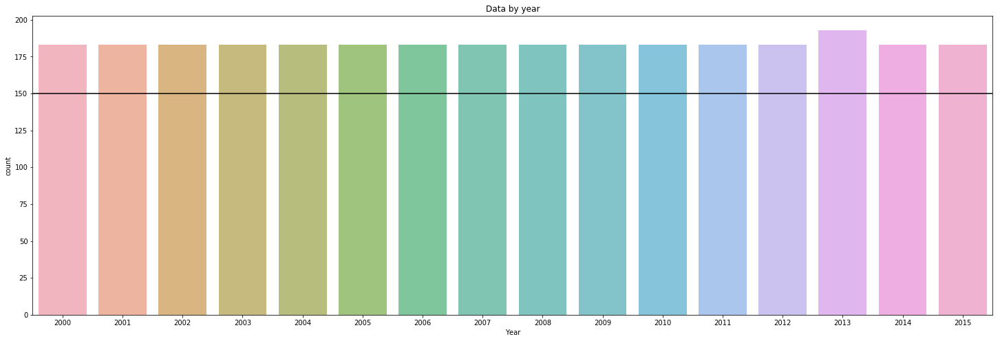

In [17]:
plt.figure(figsize=(25,8))
sns.countplot(x='Year', data=dataset, alpha=alpha)
plt.title('Data by year')
plt.axhline(y=150, color='k')
plt.show()

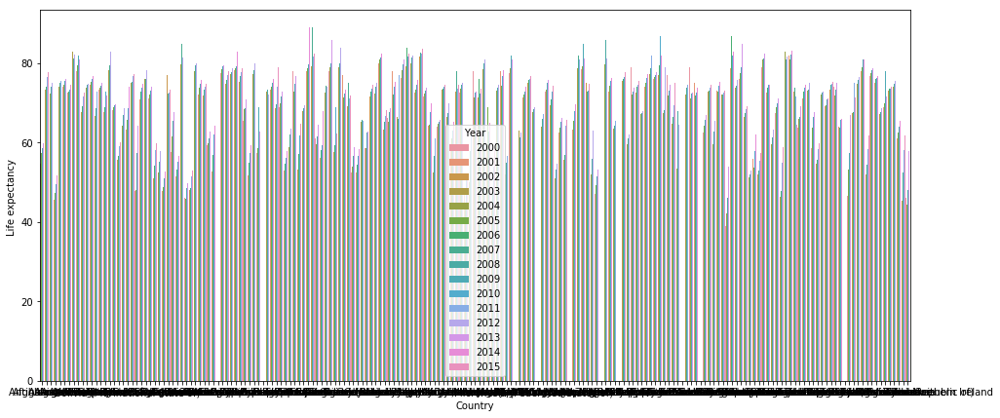

In [18]:
plt.figure(figsize=(16,7))
bar_gen = sns.barplot(x = 'Country', y = 'Life expectancy ', hue = 'Year',data = dataset)

In [19]:
dataset.dtypes

Country                             object
Year                                 int64
Status                              object
Life expectancy                    float64
Adult Mortality                    float64
infant deaths                        int64
Alcohol                            float64
percentage expenditure             float64
Hepatitis B                        float64
Measles                              int64
 BMI                               float64
under-five deaths                    int64
Polio                              float64
Total expenditure                  float64
Diphtheria                         float64
 HIV/AIDS                          float64
GDP                                float64
Population                         float64
 thinness  1-19 years              float64
 thinness 5-9 years                float64
Income composition of resources    float64
Schooling                          float64
dtype: object

In [5]:
columns_to_drop = ['Population']
select_data = dataset.drop(*columns_to_drop)

In [6]:
select_data.columns

['Country',
 'Year',
 'Status',
 'Life expectancy ',
 'Adult Mortality',
 'infant deaths',
 'Alcohol',
 'percentage expenditure',
 'Hepatitis B',
 'Measles ',
 ' BMI ',
 'under-five deaths ',
 'Polio',
 'Total expenditure',
 'Diphtheria ',
 ' HIV/AIDS',
 'GDP',
 ' thinness  1-19 years',
 ' thinness 5-9 years',
 'Income composition of resources',
 'Schooling']

In [7]:
print((select_data.count(), len(select_data.columns)))

(2938, 21)


In [31]:
print(dataset.isnull().sum())

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
 BMI                                34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
 HIV/AIDS                            0
GDP                                  0
Population                         652
 thinness  1-19 years               34
 thinness 5-9 years                 34
Income composition of resources    167
Schooling                          163
dtype: int64


In [8]:
from pyspark.sql.functions import isnan, when, count, col

select_data.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in select_data.columns]).show()

+-------+----+------+----------------+---------------+-------------+-------+----------------------+-----------+--------+-----+------------------+-----+-----------------+-----------+---------+---+---------------------+-------------------+-------------------------------+---------+
|Country|Year|Status|Life expectancy |Adult Mortality|infant deaths|Alcohol|percentage expenditure|Hepatitis B|Measles | BMI |under-five deaths |Polio|Total expenditure|Diphtheria | HIV/AIDS|GDP| thinness  1-19 years| thinness 5-9 years|Income composition of resources|Schooling|
+-------+----+------+----------------+---------------+-------------+-------+----------------------+-----------+--------+-----+------------------+-----+-----------------+-----------+---------+---+---------------------+-------------------+-------------------------------+---------+
|      0|   0|     0|              10|             10|            0|    194|                     0|        553|       0|   34|                 0|   19|         

In [9]:
clean_data=select_data.fillna(0)

In [10]:
clean_data.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in clean_data.columns]).show()

+-------+----+------+----------------+---------------+-------------+-------+----------------------+-----------+--------+-----+------------------+-----+-----------------+-----------+---------+---+---------------------+-------------------+-------------------------------+---------+
|Country|Year|Status|Life expectancy |Adult Mortality|infant deaths|Alcohol|percentage expenditure|Hepatitis B|Measles | BMI |under-five deaths |Polio|Total expenditure|Diphtheria | HIV/AIDS|GDP| thinness  1-19 years| thinness 5-9 years|Income composition of resources|Schooling|
+-------+----+------+----------------+---------------+-------------+-------+----------------------+-----------+--------+-----+------------------+-----+-----------------+-----------+---------+---+---------------------+-------------------+-------------------------------+---------+
|      0|   0|     0|               0|              0|            0|      0|                     0|          0|       0|    0|                 0|    0|         

In [11]:
clean_data.dtypes

[('Country', 'string'),
 ('Year', 'int'),
 ('Status', 'string'),
 ('Life expectancy ', 'double'),
 ('Adult Mortality', 'int'),
 ('infant deaths', 'int'),
 ('Alcohol', 'double'),
 ('percentage expenditure', 'double'),
 ('Hepatitis B', 'int'),
 ('Measles ', 'int'),
 (' BMI ', 'double'),
 ('under-five deaths ', 'int'),
 ('Polio', 'int'),
 ('Total expenditure', 'double'),
 ('Diphtheria ', 'int'),
 (' HIV/AIDS', 'double'),
 ('GDP', 'double'),
 (' thinness  1-19 years', 'double'),
 (' thinness 5-9 years', 'double'),
 ('Income composition of resources', 'double'),
 ('Schooling', 'double')]

In [24]:
clean_data.select("GDP").show()

+------------+
|         GDP|
+------------+
|  -584.25921|
| -612.696514|
| -631.744976|
|    -669.959|
|  -63.537231|
|  -553.32894|
|-445.8932979|
|-373.3611163|
| -369.835796|
|  -272.56377|
| -25.2941299|
|-219.1413528|
|-198.7285436|
|  -187.84595|
|  -117.49698|
|     -114.56|
| -3954.22783|
|-4575.763787|
| -4414.72314|
| -4247.61438|
+------------+
only showing top 20 rows



In [25]:
import pyspark.sql.functions as f

new=clean_data.select("GDP", f.regexp_replace(f.col("GDP"), "[\$#,]", "").alias("gdp"))
new.show()

+------------+------------+
|         GDP|         gdp|
+------------+------------+
|  -584.25921|  -584.25921|
| -612.696514| -612.696514|
| -631.744976| -631.744976|
|    -669.959|    -669.959|
|  -63.537231|  -63.537231|
|  -553.32894|  -553.32894|
|-445.8932979|-445.8932979|
|-373.3611163|-373.3611163|
| -369.835796| -369.835796|
|  -272.56377|  -272.56377|
| -25.2941299| -25.2941299|
|-219.1413528|-219.1413528|
|-198.7285436|-198.7285436|
|  -187.84595|  -187.84595|
|  -117.49698|  -117.49698|
|     -114.56|     -114.56|
| -3954.22783| -3954.22783|
|-4575.763787|-4575.763787|
| -4414.72314| -4414.72314|
| -4247.61438| -4247.61438|
+------------+------------+
only showing top 20 rows



In [23]:
import pyspark.sql.functions as f

construct_data=clean_data.withColumn("gdp",f.regexp_replace(f.col("GDP"), "[\$#,]", ""))
construct_data.dtypes

[('Country', 'string'),
 ('Year', 'int'),
 ('Status', 'string'),
 ('Life expectancy ', 'double'),
 ('Adult Mortality', 'int'),
 ('infant deaths', 'int'),
 ('Alcohol', 'double'),
 ('percentage expenditure', 'double'),
 ('Hepatitis B', 'int'),
 ('Measles ', 'int'),
 (' BMI ', 'double'),
 ('under-five deaths ', 'int'),
 ('Polio', 'int'),
 ('Total expenditure', 'double'),
 ('Diphtheria ', 'int'),
 (' HIV/AIDS', 'double'),
 ('gdp', 'string'),
 (' thinness  1-19 years', 'double'),
 (' thinness 5-9 years', 'double'),
 ('Income composition of resources', 'double'),
 ('Schooling', 'double')]

In [26]:
from pyspark.sql.types import IntegerType
construct_data = construct_data.withColumn("gdp", construct_data["gdp"].cast(IntegerType()))
construct_data.dtypes

[('Country', 'string'),
 ('Year', 'int'),
 ('Status', 'string'),
 ('Life expectancy ', 'double'),
 ('Adult Mortality', 'int'),
 ('infant deaths', 'int'),
 ('Alcohol', 'double'),
 ('percentage expenditure', 'double'),
 ('Hepatitis B', 'int'),
 ('Measles ', 'int'),
 (' BMI ', 'double'),
 ('under-five deaths ', 'int'),
 ('Polio', 'int'),
 ('Total expenditure', 'double'),
 ('Diphtheria ', 'int'),
 (' HIV/AIDS', 'double'),
 ('gdp', 'int'),
 (' thinness  1-19 years', 'double'),
 (' thinness 5-9 years', 'double'),
 ('Income composition of resources', 'double'),
 ('Schooling', 'double')]

In [17]:
construct_data.select("gdp").show()

+-----+
|  gdp|
+-----+
| -584|
| -612|
| -631|
| -669|
|  -63|
| -553|
| -445|
| -373|
| -369|
| -272|
|  -25|
| -219|
| -198|
| -187|
| -117|
| -114|
|-3954|
|-4575|
|-4414|
|-4247|
+-----+
only showing top 20 rows



In [18]:
columns_to_drop = ['GDP']
construct_data = construct_data.drop(*columns_to_drop)

In [27]:
construct_data.columns

['Country',
 'Year',
 'Status',
 'Life expectancy ',
 'Adult Mortality',
 'infant deaths',
 'Alcohol',
 'percentage expenditure',
 'Hepatitis B',
 'Measles ',
 ' BMI ',
 'under-five deaths ',
 'Polio',
 'Total expenditure',
 'Diphtheria ',
 ' HIV/AIDS',
 'gdp',
 ' thinness  1-19 years',
 ' thinness 5-9 years',
 'Income composition of resources',
 'Schooling']

In [28]:
from  pyspark.sql.functions import abs

construct_data2 = construct_data.withColumn('gdp',abs(construct_data["gdp"]))
construct_data2.select("gdp").show()

+----+
| gdp|
+----+
| 584|
| 612|
| 631|
| 669|
|  63|
| 553|
| 445|
| 373|
| 369|
| 272|
|  25|
| 219|
| 198|
| 187|
| 117|
| 114|
|3954|
|4575|
|4414|
|4247|
+----+
only showing top 20 rows



In [29]:
construct_data2.dtypes

[('Country', 'string'),
 ('Year', 'int'),
 ('Status', 'string'),
 ('Life expectancy ', 'double'),
 ('Adult Mortality', 'int'),
 ('infant deaths', 'int'),
 ('Alcohol', 'double'),
 ('percentage expenditure', 'double'),
 ('Hepatitis B', 'int'),
 ('Measles ', 'int'),
 (' BMI ', 'double'),
 ('under-five deaths ', 'int'),
 ('Polio', 'int'),
 ('Total expenditure', 'double'),
 ('Diphtheria ', 'int'),
 (' HIV/AIDS', 'double'),
 ('gdp', 'int'),
 (' thinness  1-19 years', 'double'),
 (' thinness 5-9 years', 'double'),
 ('Income composition of resources', 'double'),
 ('Schooling', 'double')]

In [30]:
construct_data2.show()

+-----------+----+----------+----------------+---------------+-------------+-------+----------------------+-----------+--------+-----+------------------+-----+-----------------+-----------+---------+----+---------------------+-------------------+-------------------------------+---------+
|    Country|Year|    Status|Life expectancy |Adult Mortality|infant deaths|Alcohol|percentage expenditure|Hepatitis B|Measles | BMI |under-five deaths |Polio|Total expenditure|Diphtheria | HIV/AIDS| gdp| thinness  1-19 years| thinness 5-9 years|Income composition of resources|Schooling|
+-----------+----+----------+----------------+---------------+-------------+-------+----------------------+-----------+--------+-----+------------------+-----+-----------------+-----------+---------+----+---------------------+-------------------+-------------------------------+---------+
|Afghanistan|2015|Developing|            65.0|            263|           62|   0.01|           71.27962362|         65|    1154| 19.1

In [37]:
construct_data2.toPandas().to_csv('data_integration.csv')

In [38]:
data_integration = spark.read.csv('data_integration.csv', inferSchema=True, header=True)
data_integration.printSchema() 
print((data_integration.count(), len(data_integration.columns)))

root
 |-- _c0: integer (nullable = true)
 |-- Country: string (nullable = true)
 |-- Year: integer (nullable = true)
 |-- Status: string (nullable = true)
 |-- Life expectancy : double (nullable = true)
 |-- Adult Mortality: integer (nullable = true)
 |-- infant deaths: integer (nullable = true)
 |-- Alcohol: double (nullable = true)
 |-- percentage expenditure: double (nullable = true)
 |-- Hepatitis B: integer (nullable = true)
 |-- Measles : integer (nullable = true)
 |--  BMI : double (nullable = true)
 |-- under-five deaths : integer (nullable = true)
 |-- Polio: integer (nullable = true)
 |-- Total expenditure: double (nullable = true)
 |-- Diphtheria : integer (nullable = true)
 |--  HIV/AIDS: double (nullable = true)
 |-- gdp: integer (nullable = true)
 |--  thinness  1-19 years: double (nullable = true)
 |--  thinness 5-9 years: double (nullable = true)
 |-- Income composition of resources: double (nullable = true)
 |-- Schooling: double (nullable = true)

(2938, 22)


In [39]:
columns_to_drop = ['_c0']
data_integration = data_integration.drop(*columns_to_drop)
data_integration.columns

['Country',
 'Year',
 'Status',
 'Life expectancy ',
 'Adult Mortality',
 'infant deaths',
 'Alcohol',
 'percentage expenditure',
 'Hepatitis B',
 'Measles ',
 ' BMI ',
 'under-five deaths ',
 'Polio',
 'Total expenditure',
 'Diphtheria ',
 ' HIV/AIDS',
 'gdp',
 ' thinness  1-19 years',
 ' thinness 5-9 years',
 'Income composition of resources',
 'Schooling']

In [40]:
data_integration = data_integration.toPandas()

print("country: ", data_integration["Country"].unique())
print("Status: ", data_integration["Status"].unique())

country:  ['Afghanistan' 'Albania' 'Algeria' 'Angola' 'Antigua and Barbuda'
 'Argentina' 'Armenia' 'Australia' 'Austria' 'Azerbaijan' 'Bahamas'
 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus' 'Belgium' 'Belize' 'Benin'
 'Bhutan' 'Bolivia (Plurinational State of)' 'Bosnia and Herzegovina'
 'Botswana' 'Brazil' 'Brunei Darussalam' 'Bulgaria' 'Burkina Faso'
 'Burundi' "Côte d'Ivoire" 'Cabo Verde' 'Cambodia' 'Cameroon' 'Canada'
 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia' 'Comoros'
 'Congo' 'Cook Islands' 'Costa Rica' 'Croatia' 'Cuba' 'Cyprus' 'Czechia'
 "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 'Dominica'
 'Dominican Republic' 'Ecuador' 'Egypt' 'El Salvador' 'Equatorial Guinea'
 'Eritrea' 'Estonia' 'Ethiopia' 'Fiji' 'Finland' 'France' 'Gabon' 'Gambia'
 'Georgia' 'Germany' 'Ghana' 'Greece' 'Grenada' 'Guatemala' 'Guinea'
 'Guinea-Bissau' 'Guyana' 'Haiti' 'Honduras' 'Hungary' 'Iceland' 'India'
 'Indonesia' 'Iran (Islamic Rep

In [43]:
!pip install scikit-spark

DEPRECATION: Python 3.5 reached the end of its life on September 13th, 2020. Please upgrade your Python as Python 3.5 is no longer maintained. pip 21.0 will drop support for Python 3.5 in January 2021. pip 21.0 will remove support for this functionality.
Defaulting to user installation because normal site-packages is not writeable


In [46]:
!pip install sklearn

DEPRECATION: Python 3.5 reached the end of its life on September 13th, 2020. Please upgrade your Python as Python 3.5 is no longer maintained. pip 21.0 will drop support for Python 3.5 in January 2021. pip 21.0 will remove support for this functionality.
Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 7.0 MB 3.0 MB/s eta 0:00:01     |█▍                              | 307 kB 3.0 MB/s eta 0:00:03     |███▉                            | 829 kB 3.0 MB/s eta 0:00:03     |███████████████▏                | 3.3 MB 3.0 MB/s eta 0:00:02     |████████████████████████████    | 6.1 MB 3.0 MB/s eta 0:00:01
     |████████████████████████████████| 294 kB 42.6 MB/s eta 0:00:01
  Created wheel for sklearn: filename=sklearn-0.0-py2.py3-none-any.whl size=2397 sha256=70843ee9898bdb190e438d7bff4fb1cdd106a8433dca5b19b761032010b23fa0
  Stored in directory: /home/ubuntu/.cache/pip/wheels/9e/ec/a6/33cdb5605b0b150074213e154792654a1006e6e6807dc7

In [47]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
data_integration['Country'] = le.fit_transform(data_integration['Country'])
data_integration['Status'] = le.fit_transform(data_integration['Status'])
data_integration.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 21 columns):
Country                            2938 non-null int64
Year                               2938 non-null int64
Status                             2938 non-null int64
Life expectancy                    2938 non-null float64
Adult Mortality                    2938 non-null int64
infant deaths                      2938 non-null int64
Alcohol                            2938 non-null float64
percentage expenditure             2938 non-null float64
Hepatitis B                        2938 non-null int64
Measles                            2938 non-null int64
 BMI                               2938 non-null float64
under-five deaths                  2938 non-null int64
Polio                              2938 non-null int64
Total expenditure                  2938 non-null float64
Diphtheria                         2938 non-null int64
 HIV/AIDS                          2938 non-null float64
g

In [48]:
print("country: ", data_integration["Country"].unique())
print("Status: ", data_integration["Status"].unique())

country:  [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  44  27  28  29  30  31  32  33  34
  35  36  37  38  39  40  41  42  43  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192]
Status:  [1 0]


In [49]:
data_integration.to_csv("prepared_data.csv")

In [6]:
prepared_data = spark.read.csv('prepared_data.csv', inferSchema=True, header=True)

In [7]:
columns_to_drop = ['_c0']
prepared_data = prepared_data.drop(*columns_to_drop)

In [8]:
prepared_data.printSchema() 
print((prepared_data.count(), len(prepared_data.columns)))

root
 |-- Country: integer (nullable = true)
 |-- Year: integer (nullable = true)
 |-- Status: integer (nullable = true)
 |-- Life expectancy : double (nullable = true)
 |-- Adult Mortality: integer (nullable = true)
 |-- infant deaths: integer (nullable = true)
 |-- Alcohol: double (nullable = true)
 |-- percentage expenditure: double (nullable = true)
 |-- Hepatitis B: integer (nullable = true)
 |-- Measles : integer (nullable = true)
 |--  BMI : double (nullable = true)
 |-- under-five deaths : integer (nullable = true)
 |-- Polio: integer (nullable = true)
 |-- Total expenditure: double (nullable = true)
 |-- Diphtheria : integer (nullable = true)
 |--  HIV/AIDS: double (nullable = true)
 |-- gdp: integer (nullable = true)
 |--  thinness  1-19 years: double (nullable = true)
 |--  thinness 5-9 years: double (nullable = true)
 |-- Income composition of resources: double (nullable = true)
 |-- Schooling: double (nullable = true)

(2938, 21)


In [9]:
import six
for i in prepared_data.columns:
    if not(isinstance(prepared_data.select(i).take(1)[0][0], six.string_types)):
        print("Correlation to Life expectancy for ", i, prepared_data.stat.corr('Life expectancy ',i))

Correlation to Life expectancy for  Country -0.022964545805721038
Correlation to Life expectancy for  Year 0.12904437494700624
Correlation to Life expectancy for  Status -0.4541868228211736
Correlation to Life expectancy for  Life expectancy  1.0
Correlation to Life expectancy for  Adult Mortality -0.6090533249462539
Correlation to Life expectancy for  infant deaths -0.1750691442592969
Correlation to Life expectancy for  Alcohol 0.3595935819828231
Correlation to Life expectancy for  percentage expenditure 0.3584424247833702
Correlation to Life expectancy for  Hepatitis B 0.22078228450980447
Correlation to Life expectancy for  Measles  -0.14024995302334592
Correlation to Life expectancy for   BMI  0.5071155344610497
Correlation to Life expectancy for  under-five deaths  -0.19886122454295668
Correlation to Life expectancy for  Polio 0.4276126207781976
Correlation to Life expectancy for  Total expenditure 0.13906593056421282
Correlation to Life expectancy for  Diphtheria  0.43986776269226

In [10]:
columns_to_drop = ['Country']
reduce_data = prepared_data.drop(*columns_to_drop)
reduce_data.columns

['Year',
 'Status',
 'Life expectancy ',
 'Adult Mortality',
 'infant deaths',
 'Alcohol',
 'percentage expenditure',
 'Hepatitis B',
 'Measles ',
 ' BMI ',
 'under-five deaths ',
 'Polio',
 'Total expenditure',
 'Diphtheria ',
 ' HIV/AIDS',
 'gdp',
 ' thinness  1-19 years',
 ' thinness 5-9 years',
 'Income composition of resources',
 'Schooling']

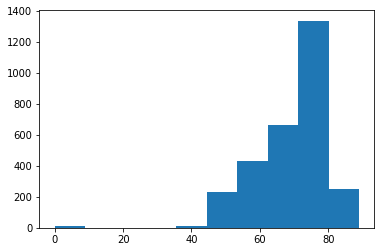

In [13]:
targetArr = np.array(prepared_data.select('Life expectancy ').collect())
plt.hist(targetArr)
plt.show()

In [14]:

from pyspark.sql.functions import col
from pyspark.sql.functions import log

project_data = reduce_data.withColumn("log_rate", log(col("Life expectancy ")+1))
project_data.columns

['Year',
 'Status',
 'Life expectancy ',
 'Adult Mortality',
 'infant deaths',
 'Alcohol',
 'percentage expenditure',
 'Hepatitis B',
 'Measles ',
 ' BMI ',
 'under-five deaths ',
 'Polio',
 'Total expenditure',
 'Diphtheria ',
 ' HIV/AIDS',
 'gdp',
 ' thinness  1-19 years',
 ' thinness 5-9 years',
 'Income composition of resources',
 'Schooling',
 'log_rate']

In [15]:
project_data.select("Life expectancy ","log_rate").show()

+----------------+-----------------+
|Life expectancy |         log_rate|
+----------------+-----------------+
|            65.0|4.189654742026425|
|            59.9|4.109233174715851|
|            59.9|4.109233174715851|
|            59.5|4.102643365036796|
|            59.2|4.097672352314776|
|            58.8|4.091005660956586|
|            58.6|4.087655574071304|
|            58.1|4.079230924412053|
|            57.5|4.069026754237811|
|            57.3|4.065602093356446|
|            57.3|4.065602093356446|
|            57.0|4.060443010546419|
|            56.7|4.055257173514054|
|            56.2|4.046553898385752|
|            55.3|4.030694535145645|
|            54.8|4.021773869387265|
|            77.8|4.366912996863833|
|            77.5|4.363098624788363|
|            77.2|4.359269647551265|
|            76.9|4.355425952876702|
+----------------+-----------------+
only showing top 20 rows



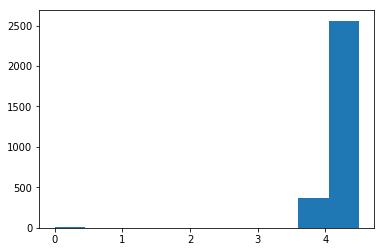

In [16]:
targetArr = np.array(project_data.select('log_rate').collect())
plt.hist(targetArr)
plt.show()

In [6]:
project_data.toPandas().to_csv('project_data.csv')

NameError: name 'project_data' is not defined

In [2]:
df = spark.read.csv('project_data.csv', inferSchema=True, header=True)
columns_to_drop = ['_c0']
df = df.drop(*columns_to_drop)

In [6]:
df.printSchema() 
print((df.count(), len(df.columns)))

root
 |-- Year: integer (nullable = true)
 |-- Status: integer (nullable = true)
 |-- Life expectancy : double (nullable = true)
 |-- Adult Mortality: integer (nullable = true)
 |-- infant deaths: integer (nullable = true)
 |-- Alcohol: double (nullable = true)
 |-- percentage expenditure: double (nullable = true)
 |-- Hepatitis B: integer (nullable = true)
 |-- Measles : integer (nullable = true)
 |--  BMI : double (nullable = true)
 |-- under-five deaths : integer (nullable = true)
 |-- Polio: integer (nullable = true)
 |-- Total expenditure: double (nullable = true)
 |-- Diphtheria : integer (nullable = true)
 |--  HIV/AIDS: double (nullable = true)
 |-- gdp: integer (nullable = true)
 |--  thinness  1-19 years: double (nullable = true)
 |--  thinness 5-9 years: double (nullable = true)
 |-- Income composition of resources: double (nullable = true)
 |-- Schooling: double (nullable = true)
 |-- log_rate: double (nullable = true)

(2938, 21)


In [3]:
from pyspark.ml.linalg import Vectors
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.regression import LinearRegression

In [4]:
assembler = VectorAssembler(
    inputCols=["Year", "Status", 
               "Adult Mortality","infant deaths","Alcohol","percentage expenditure",
               "Hepatitis B","Measles ", " BMI ","under-five deaths ", "Polio","Total expenditure", "Diphtheria ", " HIV/AIDS", "gdp", " thinness  1-19 years", " thinness 5-9 years", "Income composition of resources", "Schooling","log_rate"],
    outputCol="features")

In [5]:
output = assembler.transform(df)
output.printSchema()
output.head(1)

root
 |-- Year: integer (nullable = true)
 |-- Status: integer (nullable = true)
 |-- Life expectancy : double (nullable = true)
 |-- Adult Mortality: integer (nullable = true)
 |-- infant deaths: integer (nullable = true)
 |-- Alcohol: double (nullable = true)
 |-- percentage expenditure: double (nullable = true)
 |-- Hepatitis B: integer (nullable = true)
 |-- Measles : integer (nullable = true)
 |--  BMI : double (nullable = true)
 |-- under-five deaths : integer (nullable = true)
 |-- Polio: integer (nullable = true)
 |-- Total expenditure: double (nullable = true)
 |-- Diphtheria : integer (nullable = true)
 |--  HIV/AIDS: double (nullable = true)
 |-- gdp: integer (nullable = true)
 |--  thinness  1-19 years: double (nullable = true)
 |--  thinness 5-9 years: double (nullable = true)
 |-- Income composition of resources: double (nullable = true)
 |-- Schooling: double (nullable = true)
 |-- log_rate: double (nullable = true)
 |-- features: vector (nullable = true)



[Row(Year=2015, Status=1, Life expectancy =65.0, Adult Mortality=263, infant deaths=62, Alcohol=0.01, percentage expenditure=71.27962362, Hepatitis B=65, Measles =1154,  BMI =19.1, under-five deaths =83, Polio=6, Total expenditure=8.16, Diphtheria =65,  HIV/AIDS=0.1, gdp=584,  thinness  1-19 years=17.2,  thinness 5-9 years=17.3, Income composition of resources=0.479, Schooling=10.1, log_rate=4.189654742026425, features=DenseVector([2015.0, 1.0, 263.0, 62.0, 0.01, 71.2796, 65.0, 1154.0, 19.1, 83.0, 6.0, 8.16, 65.0, 0.1, 584.0, 17.2, 17.3, 0.479, 10.1, 4.1897]))]

In [10]:
final_df = output.select("features",'Life expectancy ')
final_df.show()

+--------------------+----------------+
|            features|Life expectancy |
+--------------------+----------------+
|[2015.0,1.0,263.0...|            65.0|
|[2014.0,1.0,271.0...|            59.9|
|[2013.0,1.0,268.0...|            59.9|
|[2012.0,1.0,272.0...|            59.5|
|[2011.0,1.0,275.0...|            59.2|
|[2010.0,1.0,279.0...|            58.8|
|[2009.0,1.0,281.0...|            58.6|
|[2008.0,1.0,287.0...|            58.1|
|[2007.0,1.0,295.0...|            57.5|
|[2006.0,1.0,295.0...|            57.3|
|[2005.0,1.0,291.0...|            57.3|
|[2004.0,1.0,293.0...|            57.0|
|[2003.0,1.0,295.0...|            56.7|
|[2002.0,1.0,3.0,8...|            56.2|
|[2001.0,1.0,316.0...|            55.3|
|[2000.0,1.0,321.0...|            54.8|
|[2015.0,1.0,74.0,...|            77.8|
|[2014.0,1.0,8.0,0...|            77.5|
|[2013.0,1.0,84.0,...|            77.2|
|[2012.0,1.0,86.0,...|            76.9|
+--------------------+----------------+
only showing top 20 rows



In [28]:
final_df.describe().show()

+-------+------------------+
|summary|  Life expectancy |
+-------+------------------+
|  count|              2938|
|   mean|  68.9893124574541|
| stddev|10.327437405657712|
|    min|               0.0|
|    max|              89.0|
+-------+------------------+



In [11]:
train_data,test_data = final_df.randomSplit([0.7,0.3])

In [30]:
train_data.describe().show()
test_data.describe().show()

+-------+-----------------+
|summary| Life expectancy |
+-------+-----------------+
|  count|             2058|
|   mean|69.10233236151609|
| stddev|10.04549323206587|
|    min|              0.0|
|    max|             89.0|
+-------+-----------------+

+-------+-----------------+
|summary| Life expectancy |
+-------+-----------------+
|  count|              880|
|   mean|           68.725|
| stddev|10.95989949963472|
|    min|              0.0|
|    max|             89.0|
+-------+-----------------+



In [7]:
lr = LinearRegression(labelCol='Life expectancy ')

In [12]:
lrModel = lr.fit(train_data)

In [13]:
print("Coefficients: {} Intercept: {}".format(lrModel.coefficients,lrModel.intercept))

Coefficients: [0.05153702437569806,-1.9768930682623767,-0.015481722794742763,0.08005178048331789,0.10238304980027817,6.952495306309e-05,0.004726525738531467,-1.23417709682617e-05,0.0481340128500254,-0.05900948070020267,0.018783520022791045,-0.0013769580159457044,0.02278648339736087,-0.2985529840745419,3.259155473134979e-05,-0.12346526808774287,0.0024284861032557526,1.6339886655822984,0.1717747292819737,19.63530381377832] Intercept: -121.30928516632824


In [34]:
lrModel.coefficients

DenseVector([0.0578, -1.9329, -0.0157, 0.08, 0.1209, 0.0, 0.0032, -0.0, 0.0441, -0.0596, 0.0197, 0.0112, 0.0231, -0.2821, 0.0, -0.1166, 0.0063, 2.2782, 0.1279, 20.4118])

In [14]:
test_results = lrModel.evaluate(test_data)

In [36]:
test_results.residuals.show()

+--------------------+
|           residuals|
+--------------------+
| 0.20982560319308874|
|   1.646793808121373|
|    5.43274943549946|
|  1.2213869242127018|
|  1.8270469060666983|
|    8.73579413390378|
|   8.525898173591287|
|  14.672972996271227|
|  17.522008637520443|
|   4.234201444159069|
|  -5.648221485213185|
| -2.2258146836914534|
|-0.16360204908950493|
|   2.582005726395437|
|  0.8928327940104737|
|  1.4210695606008557|
|   3.749126567388629|
| -1.2209492383612428|
|  0.9152301991635454|
|  1.7474298982052687|
+--------------------+
only showing top 20 rows



In [15]:
predictions_lr = lrModel.transform(test_data)
predictions_lr.select("prediction","Life expectancy ","features").show()

+-------------------+----------------+--------------------+
|         prediction|Life expectancy |            features|
+-------------------+----------------+--------------------+
| 50.517537087342674|            51.9|(20,[0,1,2,3,9,13...|
|  64.52793679171995|            73.3|(20,[0,1,2,4,5,8,...|
|  64.64475922272456|            73.4|(20,[0,1,2,4,5,8,...|
|-11.065456700582331|             0.0|(20,[0,1,4,6,8,10...|
|-11.288881830116523|             0.0|(20,[0,1,4,6,8,10...|
|  74.01285992156207|            75.9|(20,[0,2,4,6,8,10...|
|  72.72190166175236|            74.7|(20,[0,2,4,7,8,10...|
|   72.9503997548417|            75.1|(20,[0,2,4,7,8,10...|
|  74.62425435578822|            78.8|(20,[0,2,6,7,8,10...|
|  77.16056724325009|            75.8|(20,[0,2,8,10,12,...|
|  79.72168869943928|            77.6|[2000.0,0.0,11.0,...|
|   76.6285174253575|            76.6|[2000.0,0.0,11.0,...|
|  79.03762868233505|            76.9|[2000.0,0.0,12.0,...|
|  79.69363405624551|            79.7|[2

In [38]:
print("RSME: {}".format(test_results.rootMeanSquaredError))

RSME: 3.2676982881364283


In [39]:
print("R2: {}".format(test_results.r2))

R2: 0.9110052157053163


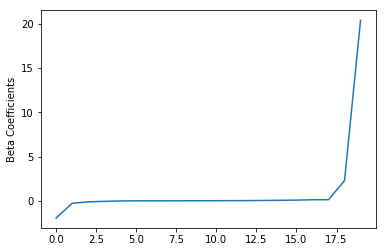

In [43]:
import numpy as np 
import matplotlib.pyplot as plt

beta=np.sort(lrModel.coefficients)
plt.plot(beta)
plt.ylabel('Beta Coefficients')
plt.show()

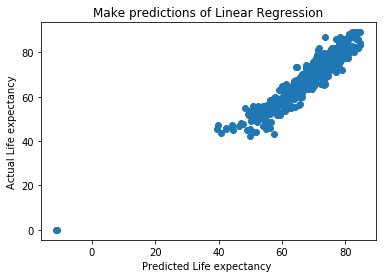

In [18]:
plt.scatter(x=predictions_lr.toPandas()["prediction"],y=predictions_lr.toPandas()["Life expectancy "])
plt.title('Make predictions of Linear Regression')
plt.xlabel('Predicted Life expectancy ')
plt.ylabel('Actual Life expectancy')
plt.show()

In [21]:
lr_lasso = LinearRegression(maxIter=10, regParam=0.3, elasticNetParam=1.0,
                            labelCol='Life expectancy ')

In [22]:
lr_lassoModel = lr_lasso.fit(train_data)
print("Coefficients(Lasso): {} Intercept(Lasso): {}".format(lr_lassoModel.coefficients,lr_lassoModel.intercept))

Coefficients(Lasso): [0.00041608541730455236,-1.8750883388012105,-0.015806555502152143,0.0,0.027852031586375305,3.855235947887556e-05,0.0006214757378571173,0.0,0.05076732013492548,0.0,0.01950546485642758,0.0,0.02649442402855664,-0.274270627353027,2.363452570218071e-05,-0.07280437042115842,-0.024648157229700665,2.516891686591651,0.1506141600932164,19.368949418079996] Intercept(Lasso): -17.923081622791003


In [23]:
test_results_lasso = lr_lassoModel.evaluate(test_data)
test_results_lasso.residuals.show()

+--------------------+
|           residuals|
+--------------------+
|   1.123681362896157|
|   8.563497063234095|
|   8.593441124954126|
|  10.225055971532395|
|  10.457654867651643|
|   2.929663513344437|
|   2.357492468642917|
|  2.5955991460363492|
|   4.742113430183963|
| -1.4830948562180453|
|  -2.182452903933992|
|  0.3140218661296501|
|  -2.228086224562844|
|-0.03037327294435954|
| -0.7832915911593403|
|   1.397670647571701|
| 0.23257530633021872|
|   2.092556342667123|
|   2.939619504495468|
|  -3.074492438148468|
+--------------------+
only showing top 20 rows



In [24]:
predictions_lasso = lr_lassoModel.transform(test_data)
predictions_lasso.select("prediction","Life expectancy ","features").show()

+-------------------+----------------+--------------------+
|         prediction|Life expectancy |            features|
+-------------------+----------------+--------------------+
|  50.77631863710384|            51.9|(20,[0,1,2,3,9,13...|
|   64.7365029367659|            73.3|(20,[0,1,2,4,5,8,...|
|  64.80655887504588|            73.4|(20,[0,1,2,4,5,8,...|
|-10.225055971532395|             0.0|(20,[0,1,4,6,8,10...|
|-10.457654867651643|             0.0|(20,[0,1,4,6,8,10...|
|  72.97033648665557|            75.9|(20,[0,2,4,6,8,10...|
|  72.34250753135709|            74.7|(20,[0,2,4,7,8,10...|
|  72.50440085396365|            75.1|(20,[0,2,4,7,8,10...|
|  74.05788656981603|            78.8|(20,[0,2,6,7,8,10...|
|  77.28309485621804|            75.8|(20,[0,2,8,10,12,...|
|  79.78245290393399|            77.6|[2000.0,0.0,11.0,...|
|  76.28597813387034|            76.6|[2000.0,0.0,11.0,...|
|  79.12808622456285|            76.9|[2000.0,0.0,12.0,...|
|  79.73037327294436|            79.7|[2

In [48]:
print("RSME(Lasso): {}".format(test_results_lasso.rootMeanSquaredError))

RSME(Lasso): 3.4400693042326163


In [49]:
print("R2(Lasso): {}".format(test_results_lasso.r2))

R2(Lasso): 0.9013686363466322


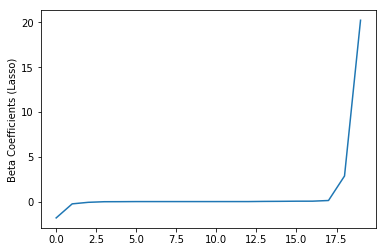

In [50]:
beta_lasso=np.sort(lr_lassoModel.coefficients)
plt.plot(beta_lasso)
plt.ylabel('Beta Coefficients (Lasso)')
plt.show()

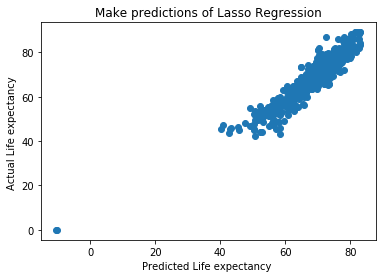

In [25]:
plt.scatter(x=predictions_lasso.toPandas()["prediction"],y=predictions_lasso.toPandas()["Life expectancy "])
plt.title('Make predictions of Lasso Regression')
plt.xlabel('Predicted Life expectancy ')
plt.ylabel('Actual Life expectancy ')
plt.show()

In [26]:
lr_ridge = LinearRegression(maxIter=10, regParam=0.3, elasticNetParam=0,
                            labelCol='Life expectancy ')

In [27]:
lr_ridgeModel = lr_ridge.fit(train_data)
print("Coefficients(Ridge): {} Intercept(Ridge): {}".format(lr_ridgeModel.coefficients,lr_ridgeModel.intercept))

Coefficients(Ridge): [0.04659737608874649,-1.9992205039526953,-0.015720475717125527,0.006861190541993203,0.08130253251153906,0.00010517263181652556,0.005319621260729276,-1.691031282756324e-05,0.049549236154730884,-0.00504619126246582,0.021438921281653266,-0.00285339133412527,0.026640705121523545,-0.30531675828611043,2.6364787420097872e-05,-0.10538670944980816,-0.008682441466719803,2.3157798904782276,0.15888414323422229,19.18488229392059] Intercept(Ridge): -110.27064468405852


In [28]:
test_results_ridge = lr_ridgeModel.evaluate(test_data)
test_results_ridge.residuals.show()

+--------------------+
|           residuals|
+--------------------+
|  1.8503718165099272|
|   9.535109515655535|
|    9.52174258721449|
|   9.184884803261355|
|    9.41433563107799|
|  2.2357507262885434|
|  2.3489627415378322|
|    2.53405894867349|
|   4.289326647531908|
|  -1.495609282848278|
|  -2.113015865644101|
| 0.05597918280876968|
| -2.1584874479825515|
|-0.10581440292386901|
| -0.8472421473262983|
|  1.3321464438526363|
|-0.16625109462277976|
|  2.1510797702292876|
|   2.486301812187648|
| -3.3044160849607778|
+--------------------+
only showing top 20 rows



In [30]:
predictions_ridge = lr_ridgeModel.transform(test_data)
predictions_ridge.select("prediction","Life expectancy ","features").show()

+------------------+----------------+--------------------+
|        prediction|Life expectancy |            features|
+------------------+----------------+--------------------+
| 50.04962818349007|            51.9|(20,[0,1,2,3,9,13...|
| 63.76489048434446|            73.3|(20,[0,1,2,4,5,8,...|
|63.878257412785516|            73.4|(20,[0,1,2,4,5,8,...|
|-9.184884803261355|             0.0|(20,[0,1,4,6,8,10...|
| -9.41433563107799|             0.0|(20,[0,1,4,6,8,10...|
| 73.66424927371146|            75.9|(20,[0,2,4,6,8,10...|
| 72.35103725846217|            74.7|(20,[0,2,4,7,8,10...|
|  72.5659410513265|            75.1|(20,[0,2,4,7,8,10...|
| 74.51067335246809|            78.8|(20,[0,2,6,7,8,10...|
| 77.29560928284828|            75.8|(20,[0,2,8,10,12,...|
|  79.7130158656441|            77.6|[2000.0,0.0,11.0,...|
| 76.54402081719122|            76.6|[2000.0,0.0,11.0,...|
| 79.05848744798256|            76.9|[2000.0,0.0,12.0,...|
| 79.80581440292387|            79.7|[2000.0,0.0,74.0,..

In [56]:
print("RSME(Ridge): {}".format(test_results_ridge.rootMeanSquaredError))

RSME(Ridge): 3.3464553556316377


In [57]:
print("R2(Ridge): {}".format(test_results_ridge.r2))

R2(Ridge): 0.9066636690781462


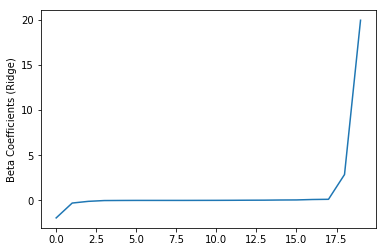

In [58]:
beta_ridge=np.sort(lr_ridgeModel.coefficients)
plt.plot(beta_ridge)
plt.ylabel('Beta Coefficients (Ridge)')
plt.show()

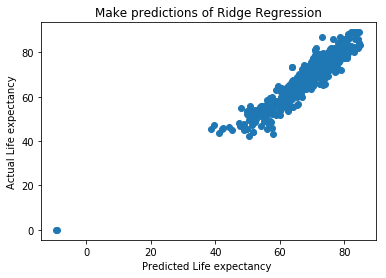

In [32]:
plt.scatter(x=predictions_ridge.toPandas()["prediction"],y=predictions_ridge.toPandas()["Life expectancy "])
plt.title('Make predictions of Ridge Regression')
plt.xlabel('Predicted Life expectancy ')
plt.ylabel('Actual Life expectancy')
plt.show()

In [33]:
lr_ElasticNet = LinearRegression(maxIter=10, regParam=0.3, elasticNetParam=0.8,
                                 labelCol='Life expectancy ')

In [34]:
lr_ElasticNetModel = lr_ElasticNet.fit(train_data)
print("Coefficients(Elastic-Net): {} Intercept(Elastic-Net): {}".format(lr_ElasticNetModel.coefficients,
                                                            lr_ElasticNetModel.intercept))

Coefficients(Elastic-Net): [0.011353060821423126,-1.9111641713018606,-0.01576514461539635,0.0,0.03782861238266464,4.970562644344319e-05,0.0014109545815609184,-1.044690371233137e-06,0.05062475643535982,0.0,0.020393918970324814,0.0,0.02640392842568,-0.28042477175222047,2.393314288011943e-05,-0.07598242754566233,-0.025507815746217608,2.5137963722013903,0.15090646152995119,19.33743529399759] Intercept(Elastic-Net): -39.85531389522521


In [35]:
test_results_ElasticNet = lr_ElasticNetModel.evaluate(test_data)
test_results_ElasticNet.residuals.show()

+--------------------+
|           residuals|
+--------------------+
|  1.2965553313326765|
|   8.794825904337984|
|   8.813867040015197|
|  10.034387421733665|
|  10.264614780150577|
|  2.7969602728362872|
|   2.355143273629025|
|  2.5818311095020476|
|   4.634130516139592|
| -1.5259626372215678|
| -2.1746977191443193|
|  0.2680801779298889|
|  -2.222962412724584|
|-0.04082678445452359|
| -0.7977131688362817|
|  1.3824647120913767|
| 0.16120922596891774|
|  2.0971006832054684|
|  2.8776279888476495|
| -3.1170371122671554|
+--------------------+
only showing top 20 rows



In [36]:
predictions_ElasticNet = lr_ElasticNetModel.transform(test_data)
predictions_ElasticNet.select("Life expectancy ","features").show()

+----------------+--------------------+
|Life expectancy |            features|
+----------------+--------------------+
|            51.9|(20,[0,1,2,3,9,13...|
|            73.3|(20,[0,1,2,4,5,8,...|
|            73.4|(20,[0,1,2,4,5,8,...|
|             0.0|(20,[0,1,4,6,8,10...|
|             0.0|(20,[0,1,4,6,8,10...|
|            75.9|(20,[0,2,4,6,8,10...|
|            74.7|(20,[0,2,4,7,8,10...|
|            75.1|(20,[0,2,4,7,8,10...|
|            78.8|(20,[0,2,6,7,8,10...|
|            75.8|(20,[0,2,8,10,12,...|
|            77.6|[2000.0,0.0,11.0,...|
|            76.6|[2000.0,0.0,11.0,...|
|            76.9|[2000.0,0.0,12.0,...|
|            79.7|[2000.0,0.0,74.0,...|
|            78.1|[2000.0,0.0,84.0,...|
|            78.5|[2000.0,0.0,85.0,...|
|            79.1|[2000.0,0.0,86.0,...|
|            78.6|[2000.0,0.0,87.0,...|
|            78.1|[2000.0,0.0,96.0,...|
|            71.1|[2000.0,0.0,163.0...|
+----------------+--------------------+
only showing top 20 rows



In [37]:
print("RSME(Elastic-Net): {}".format(test_results_ElasticNet.rootMeanSquaredError))

RSME(Elastic-Net): 3.3210365425409245


In [66]:
print("R2(Elastic-Net): {}".format(test_results_ElasticNet.r2))

R2(Elastic-Net): 0.9026756951757104


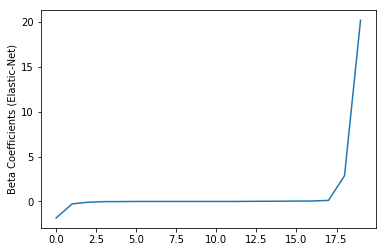

In [67]:
beta_ElasticNet=np.sort(lr_ElasticNetModel.coefficients)
plt.plot(beta_ElasticNet)
plt.ylabel('Beta Coefficients (Elastic-Net)')
plt.show()

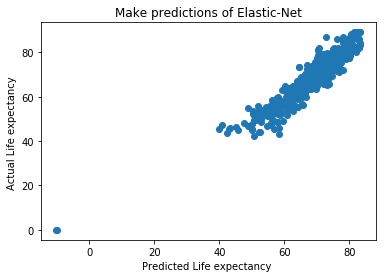

In [39]:
plt.scatter(x=predictions_ElasticNet.toPandas()["prediction"],y=predictions_ElasticNet.toPandas()["Life expectancy "])
plt.title('Make predictions of Elastic-Net')
plt.xlabel('Predicted Life expectancy ')
plt.ylabel('Actual Life expectancy ')
plt.show()

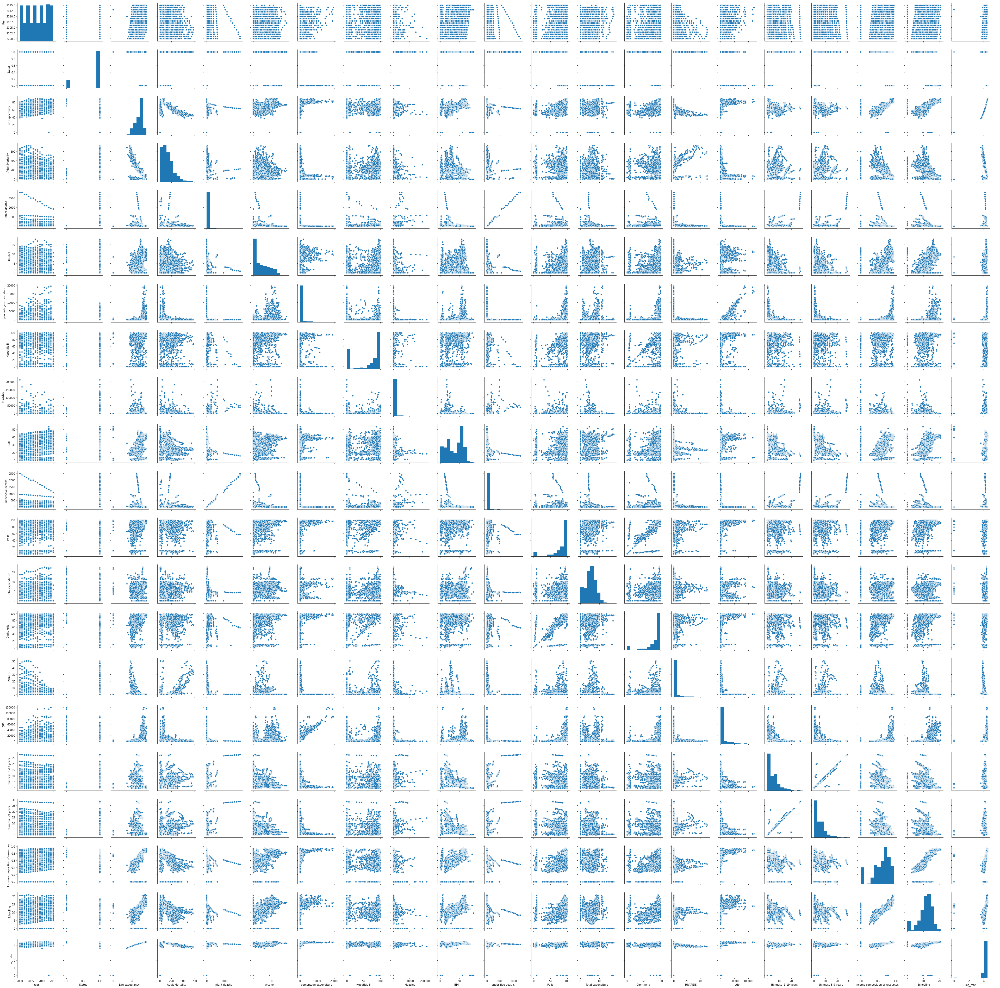

In [71]:
dataset=df.toPandas()
sns.pairplot(dataset)

AttributeError: 'DataFrame' object has no attribute 'year'

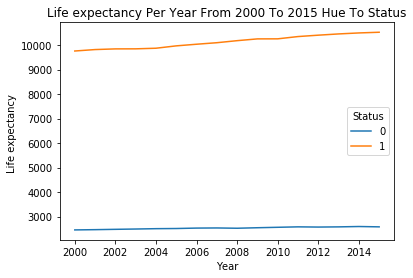

In [72]:
dataset.pivot_table('Life expectancy ', index='Year', columns='Status', aggfunc='sum').plot()
plt.title('Life expectancy Per Year From 2000 To 2015 Hue To Status')
plt.ylabel('Life expectancy ')
plt.xlabel('Year')
plt.xlim((dataset.year.min() - 1), (dataset.year.max() + 1))
plt.show()

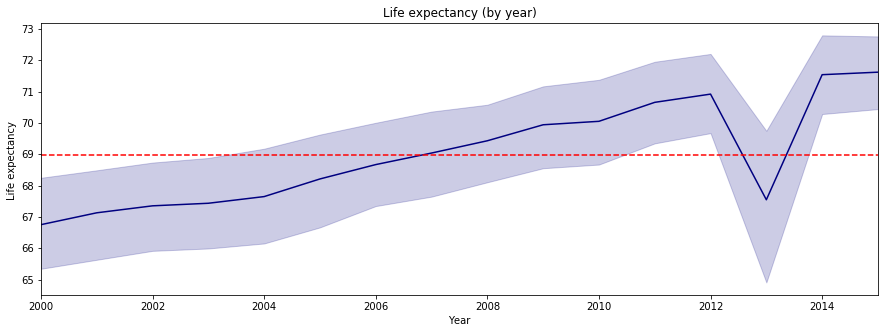

In [73]:
plt.figure(figsize=(15,5))
sns.lineplot(x='Year', y='Life expectancy ', data=dataset, color='navy')
plt.axhline(dataset['Life expectancy '].mean(), ls='--', color='red')
plt.title('Life expectancy (by year)')
plt.xlim(2000,2015)
plt.show()

In [8]:
import six
for i in df.columns:
    if not(isinstance(df.select(i).take(1)[0][0], six.string_types)):
        print("Correlation to log_rate for ", i, df.stat.corr('log_rate',i))

Correlation to log_rate for  Year 0.027169153151333943
Correlation to log_rate for  Status -0.2504669240786342
Correlation to log_rate for  Life expectancy  0.8001516632851399
Correlation to log_rate for  Adult Mortality -0.2853811767261936
Correlation to log_rate for  infant deaths -0.08369669184208592
Correlation to log_rate for  Alcohol 0.2174277066448214
Correlation to log_rate for  percentage expenditure 0.19373913412714444
Correlation to log_rate for  Hepatitis B 0.12024409481145674
Correlation to log_rate for  Measles  -0.07021511591618723
Correlation to log_rate for   BMI  0.24180686093097645
Correlation to log_rate for  under-five deaths  -0.09730147519296461
Correlation to log_rate for  Polio 0.23290098486816313
Correlation to log_rate for  Total expenditure 0.03346470918705247
Correlation to log_rate for  Diphtheria  0.23994487219235214
Correlation to log_rate for   HIV/AIDS -0.2796796928454115
Correlation to log_rate for  gdp 0.22232879867319877
Correlation to log_rate for 

In [9]:
assembler = VectorAssembler(
    inputCols=["Year", "Status", 
               "Adult Mortality","infant deaths","Alcohol","percentage expenditure",
               "Hepatitis B","Measles ", " BMI ","under-five deaths ", "Polio","Total expenditure", "Diphtheria ", " HIV/AIDS", "gdp", " thinness  1-19 years", " thinness 5-9 years", "Income composition of resources", "Schooling","log_rate"],
    outputCol="features")

In [11]:
output = assembler.transform(df)
output.printSchema()
output.head(1)

root
 |-- Year: integer (nullable = true)
 |-- Status: integer (nullable = true)
 |-- Life expectancy : double (nullable = true)
 |-- Adult Mortality: integer (nullable = true)
 |-- infant deaths: integer (nullable = true)
 |-- Alcohol: double (nullable = true)
 |-- percentage expenditure: double (nullable = true)
 |-- Hepatitis B: integer (nullable = true)
 |-- Measles : integer (nullable = true)
 |--  BMI : double (nullable = true)
 |-- under-five deaths : integer (nullable = true)
 |-- Polio: integer (nullable = true)
 |-- Total expenditure: double (nullable = true)
 |-- Diphtheria : integer (nullable = true)
 |--  HIV/AIDS: double (nullable = true)
 |-- gdp: integer (nullable = true)
 |--  thinness  1-19 years: double (nullable = true)
 |--  thinness 5-9 years: double (nullable = true)
 |-- Income composition of resources: double (nullable = true)
 |-- Schooling: double (nullable = true)
 |-- log_rate: double (nullable = true)
 |-- features: vector (nullable = true)



[Row(Year=2015, Status=1, Life expectancy =65.0, Adult Mortality=263, infant deaths=62, Alcohol=0.01, percentage expenditure=71.27962362, Hepatitis B=65, Measles =1154,  BMI =19.1, under-five deaths =83, Polio=6, Total expenditure=8.16, Diphtheria =65,  HIV/AIDS=0.1, gdp=584,  thinness  1-19 years=17.2,  thinness 5-9 years=17.3, Income composition of resources=0.479, Schooling=10.1, log_rate=4.189654742026425, features=DenseVector([2015.0, 1.0, 263.0, 62.0, 0.01, 71.2796, 65.0, 1154.0, 19.1, 83.0, 6.0, 8.16, 65.0, 0.1, 584.0, 17.2, 17.3, 0.479, 10.1, 4.1897]))]

In [12]:
final_df = output.select("features",'log_rate')
final_df.show()

+--------------------+-----------------+
|            features|         log_rate|
+--------------------+-----------------+
|[2015.0,1.0,263.0...|4.189654742026425|
|[2014.0,1.0,271.0...|4.109233174715851|
|[2013.0,1.0,268.0...|4.109233174715851|
|[2012.0,1.0,272.0...|4.102643365036796|
|[2011.0,1.0,275.0...|4.097672352314776|
|[2010.0,1.0,279.0...|4.091005660956586|
|[2009.0,1.0,281.0...|4.087655574071304|
|[2008.0,1.0,287.0...|4.079230924412053|
|[2007.0,1.0,295.0...|4.069026754237811|
|[2006.0,1.0,295.0...|4.065602093356446|
|[2005.0,1.0,291.0...|4.065602093356446|
|[2004.0,1.0,293.0...|4.060443010546419|
|[2003.0,1.0,295.0...|4.055257173514054|
|[2002.0,1.0,3.0,8...|4.046553898385752|
|[2001.0,1.0,316.0...|4.030694535145645|
|[2000.0,1.0,321.0...|4.021773869387265|
|[2015.0,1.0,74.0,...|4.366912996863833|
|[2014.0,1.0,8.0,0...|4.363098624788363|
|[2013.0,1.0,84.0,...|4.359269647551265|
|[2012.0,1.0,86.0,...|4.355425952876702|
+--------------------+-----------------+
only showing top

In [13]:
final_df.describe().show()

+-------+-------------------+
|summary|           log_rate|
+-------+-------------------+
|  count|               2938|
|   mean|  4.227258446245809|
| stddev|0.28625049540440956|
|    min|                0.0|
|    max|  4.499809670330265|
+-------+-------------------+



In [14]:
train_data,test_data = final_df.randomSplit([0.7,0.3])
train_data.describe().show()
test_data.describe().show()

+-------+------------------+
|summary|          log_rate|
+-------+------------------+
|  count|              2076|
|   mean| 4.229587952760822|
| stddev|0.2701504411770524|
|    min|               0.0|
|    max| 4.499809670330265|
+-------+------------------+

+-------+-------------------+
|summary|           log_rate|
+-------+-------------------+
|  count|                862|
|   mean|  4.221648173014835|
| stddev|0.32183660312600765|
|    min|                0.0|
|    max|  4.499809670330265|
+-------+-------------------+



In [15]:
# Linear Regression
lr = LinearRegression(labelCol='log_rate')
# Lasso Regression
lr_lasso = LinearRegression(maxIter=10, regParam=0.3, elasticNetParam=1.0,
                            labelCol='log_rate')
# Ridge Regression
lr_ridge = LinearRegression(maxIter=10, regParam=0.3, elasticNetParam=0,
                            labelCol='log_rate')
# Elastic-Net
lr_ElasticNet = LinearRegression(maxIter=10, regParam=0.3, elasticNetParam=0.8,
                                 labelCol='log_rate')
# Fit the model to the data.
lrModel = lr.fit(train_data)
lr_lassoModel = lr_lasso.fit(train_data)
lr_ridgeModel = lr_ridge.fit(train_data)
lr_ElasticNetModel = lr_ElasticNet.fit(train_data)

In [16]:
print("Coefficients: {} Intercept: {}".format(lrModel.coefficients,lrModel.intercept))
print("\n")
print("Coefficients(Lasso): {} Intercept(Lasso): {}".format(lr_lassoModel.coefficients,lr_lassoModel.intercept))
print("\n")
print("Coefficients(Ridge): {} Intercept(Ridge): {}".format(lr_ridgeModel.coefficients,lr_ridgeModel.intercept))
print("\n")
print("Coefficients(Elastic-Net): {} Intercept(Elastic-Net): {}".format(lr_ElasticNetModel.coefficients,
                                                        lr_ElasticNetModel.intercept))

Coefficients: [-6.113619064019371e-17,-1.1013972654884647e-15,-1.9097224142399802e-18,4.337791347457812e-17,1.2058921570273285e-16,-8.526587271227232e-21,3.119560277888341e-18,-3.624059004444845e-21,1.1784194164258561e-17,-3.274022467326474e-17,8.486586255956012e-18,-1.0406129379281986e-16,1.244377365011787e-17,-1.969069087122145e-16,1.6931369793467992e-20,2.4210371036039664e-17,6.840768978955412e-18,3.277826556649381e-15,3.5128967176658985e-17,0.9999999999999801] Intercept: 2.0339573331016206e-13


Coefficients(Lasso): [0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0] Intercept(Lasso): 4.229587952760822


Coefficients(Ridge): [-0.00040979499075855294,-0.02029133878433404,-7.616107811297169e-05,-1.899358705799863e-06,0.0016388050606307798,1.6904196936584285e-06,8.32170791015575e-05,-5.1532150972545266e-08,0.000307322940665801,-9.355188820458675e-06,0.0002700109133107503,-0.0008977257596522222,0.00029561790262897886,-0.002752378693529214,3.358626667861166

In [17]:
test_results = lrModel.evaluate(test_data)
test_results.residuals.show()

+--------------------+
|           residuals|
+--------------------+
|2.664535259100375...|
|8.881784197001252...|
|1.776356839400250...|
|-8.17544235930520...|
|-8.11421780221525...|
|3.552713678800501...|
|-8.88178419700125...|
|                 0.0|
|                 0.0|
|                 0.0|
|-8.88178419700125...|
|-8.88178419700125...|
|1.776356839400250...|
|                 0.0|
|                 0.0|
|                 0.0|
|2.664535259100375...|
|-8.88178419700125...|
|-2.66453525910037...|
|-2.22044604925031...|
+--------------------+
only showing top 20 rows



In [18]:
test_results_lasso = lr_lassoModel.evaluate(test_data)
test_results_lasso.residuals.show()

+--------------------+
|           residuals|
+--------------------+
|-0.15205050885510207|
|-0.26118461389656833|
|-0.23875376690838612|
|  -4.229587952760822|
|  -4.229587952760822|
| 0.14993555169494144|
| 0.12197947442835133|
| 0.15991069675176117|
| 0.15742622342409884|
|  0.1611506225150814|
| 0.09719020768258169|
| 0.12712087392876992|
| 0.13095965023593603|
|  0.1335106720275414|
|0.013176614579552215|
| 0.09056327819497234|
|0.018907289288537577|
|-0.11871408858751042|
|-0.18829261162853683|
| -0.3016915981763857|
+--------------------+
only showing top 20 rows



In [19]:
test_results_ridge = lr_ridgeModel.evaluate(test_data)
test_results_ridge.residuals.show()

+--------------------+
|           residuals|
+--------------------+
|   0.052282696322556|
|-0.00829412300644...|
|0.006028744993094026|
| -2.3983948398306953|
| -2.3773203454156304|
|  0.0954809059366113|
| 0.00933493977406119|
| 0.01255578828295878|
| 0.02088537323481976|
|0.018522286630457074|
|-8.12006073136473...|
|0.018366457347942067|
|0.040233818424860956|
| 0.01368532452088811|
|0.004619705192932422|
| 0.01580838553388375|
| 0.04069565823220689|
|-0.02927445065664447|
|-0.06931454331593478|
|-0.10740627581121753|
+--------------------+
only showing top 20 rows



In [20]:
test_results_ElasticNet = lr_ElasticNetModel.evaluate(test_data)
test_results_ElasticNet.residuals.show()

+--------------------+
|           residuals|
+--------------------+
| -0.1381891893352174|
|-0.23737434575502459|
| -0.2169883530691794|
| -3.8440077235848493|
| -3.8440077235848493|
|  0.1362670371659025|
| 0.11085950855220794|
| 0.14533282207699916|
| 0.14307483979427094|
| 0.14645971298554805|
| 0.08833009578268669|
| 0.11553220471324721|
| 0.11902102819644966|
| 0.12133949221220863|
|0.011975400152499205|
| 0.08230729440852524|
|0.017183651662747046|
|-0.10789180377035468|
|-0.17112736783771254|
| -0.2741886080826612|
+--------------------+
only showing top 20 rows



In [21]:
print("RSME: {}".format(test_results.rootMeanSquaredError))
print("R2: {}".format(test_results.r2))

RSME: 5.77195153756825e-15
R2: 1.0


In [22]:
print("RSME(Lasso): {}".format(test_results_lasso.rootMeanSquaredError))
print("R2(Lasso): {}".format(test_results_lasso.r2))

RSME(Lasso): 0.3217478487795235
R2(Lasso): -0.0006093266215119186


In [23]:
print("RSME(Ridge): {}".format(test_results_ridge.rootMeanSquaredError))
print("R2(Ridge): {}".format(test_results_ridge.r2))

RSME(Ridge): 0.16956578049153456
R2(Ridge): 0.7220864836034213


In [24]:
print("RSME(Elastic-Net): {}".format(test_results_ElasticNet.rootMeanSquaredError))
print("R2(Elastic-Net): {}".format(test_results_ElasticNet.r2))

RSME(Elastic-Net): 0.2924164787607712
R2(Elastic-Net): 0.17351128307965147


In [25]:
predictions_lr = lrModel.transform(test_data)
predictions_lr.select("prediction","log_rate","features").show()

+--------------------+------------------+--------------------+
|          prediction|          log_rate|            features|
+--------------------+------------------+--------------------+
|   4.077537443905717|  4.07753744390572|(20,[0,1,2,3,9,13...|
|  3.9684033388642526|3.9684033388642534|(20,[0,1,2,3,9,13...|
|   3.990834185852434|3.9908341858524357|(20,[0,1,2,3,9,13...|
|8.175442359305207...|               0.0|(20,[0,1,4,6,8,10...|
|8.114217802215257...|               0.0|(20,[0,1,4,6,10,1...|
|    4.37952350445576| 4.379523504455763|(20,[0,2,6,7,8,10...|
|   4.351567427189174| 4.351567427189173|[2000.0,0.0,11.0,...|
|   4.389498649512583| 4.389498649512583|[2000.0,0.0,73.0,...|
|   4.387014176184921| 4.387014176184921|[2000.0,0.0,77.0,...|
|   4.390738575275903| 4.390738575275903|[2000.0,0.0,78.0,...|
|   4.326778160443404|4.3267781604434035|[2000.0,0.0,127.0...|
|   4.356708826689593| 4.356708826689592|[2000.0,0.0,175.0...|
|   4.360547602996756| 4.360547602996758|[2000.0,1.0,13

In [26]:
predictions_lasso = lr_lassoModel.transform(test_data)
predictions_lasso.select("prediction","log_rate","features").show()

+-----------------+------------------+--------------------+
|       prediction|          log_rate|            features|
+-----------------+------------------+--------------------+
|4.229587952760822|  4.07753744390572|(20,[0,1,2,3,9,13...|
|4.229587952760822|3.9684033388642534|(20,[0,1,2,3,9,13...|
|4.229587952760822|3.9908341858524357|(20,[0,1,2,3,9,13...|
|4.229587952760822|               0.0|(20,[0,1,4,6,8,10...|
|4.229587952760822|               0.0|(20,[0,1,4,6,10,1...|
|4.229587952760822| 4.379523504455763|(20,[0,2,6,7,8,10...|
|4.229587952760822| 4.351567427189173|[2000.0,0.0,11.0,...|
|4.229587952760822| 4.389498649512583|[2000.0,0.0,73.0,...|
|4.229587952760822| 4.387014176184921|[2000.0,0.0,77.0,...|
|4.229587952760822| 4.390738575275903|[2000.0,0.0,78.0,...|
|4.229587952760822|4.3267781604434035|[2000.0,0.0,127.0...|
|4.229587952760822| 4.356708826689592|[2000.0,0.0,175.0...|
|4.229587952760822| 4.360547602996758|[2000.0,1.0,13.0,...|
|4.229587952760822| 4.363098624788363|[2

In [27]:
predictions_ridge = lr_ridgeModel.transform(test_data)
predictions_ridge.select("prediction","log_rate","features").show()

+------------------+------------------+--------------------+
|        prediction|          log_rate|            features|
+------------------+------------------+--------------------+
| 4.025254747583164|  4.07753744390572|(20,[0,1,2,3,9,13...|
|3.9766974618707023|3.9684033388642534|(20,[0,1,2,3,9,13...|
|3.9848054408593416|3.9908341858524357|(20,[0,1,2,3,9,13...|
|2.3983948398306953|               0.0|(20,[0,1,4,6,8,10...|
|2.3773203454156304|               0.0|(20,[0,1,4,6,10,1...|
| 4.284042598519152| 4.379523504455763|(20,[0,2,6,7,8,10...|
| 4.342232487415112| 4.351567427189173|[2000.0,0.0,11.0,...|
| 4.376942861229624| 4.389498649512583|[2000.0,0.0,73.0,...|
| 4.366128802950101| 4.387014176184921|[2000.0,0.0,77.0,...|
| 4.372216288645446| 4.390738575275903|[2000.0,0.0,78.0,...|
| 4.326859361050717|4.3267781604434035|[2000.0,0.0,127.0...|
|  4.33834236934165| 4.356708826689592|[2000.0,0.0,175.0...|
| 4.320313784571897| 4.360547602996758|[2000.0,1.0,13.0,...|
| 4.349413300267475| 4.3

In [28]:
predictions_ElasticNet = lr_ElasticNetModel.transform(test_data)
predictions_ElasticNet.select("prediction","log_rate","features").show()

+------------------+------------------+--------------------+
|        prediction|          log_rate|            features|
+------------------+------------------+--------------------+
| 4.215726633240937|  4.07753744390572|(20,[0,1,2,3,9,13...|
| 4.205777684619278|3.9684033388642534|(20,[0,1,2,3,9,13...|
| 4.207822538921615|3.9908341858524357|(20,[0,1,2,3,9,13...|
|3.8440077235848493|               0.0|(20,[0,1,4,6,8,10...|
|3.8440077235848493|               0.0|(20,[0,1,4,6,10,1...|
| 4.243256467289861| 4.379523504455763|(20,[0,2,6,7,8,10...|
| 4.240707918636965| 4.351567427189173|[2000.0,0.0,11.0,...|
| 4.244165827435584| 4.389498649512583|[2000.0,0.0,73.0,...|
|  4.24393933639065| 4.387014176184921|[2000.0,0.0,77.0,...|
| 4.244278862290355| 4.390738575275903|[2000.0,0.0,78.0,...|
| 4.238448064660717|4.3267781604434035|[2000.0,0.0,127.0...|
|4.2411766219763445| 4.356708826689592|[2000.0,0.0,175.0...|
| 4.241526574800308| 4.360547602996758|[2000.0,1.0,13.0,...|
| 4.241759132576155| 4.3

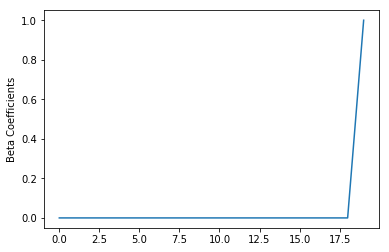

In [30]:
import numpy as np 
import matplotlib.pyplot as plt

beta=np.sort(lrModel.coefficients)
plt.plot(beta)
plt.ylabel('Beta Coefficients')
plt.show()

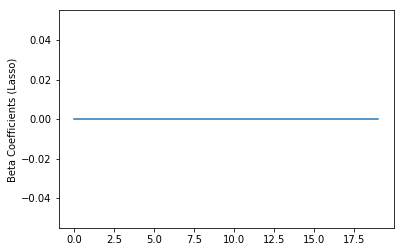

In [33]:
beta_lasso=np.sort(lr_lassoModel.coefficients)
plt.plot(beta_lasso)
plt.ylabel('Beta Coefficients (Lasso)')
plt.show()

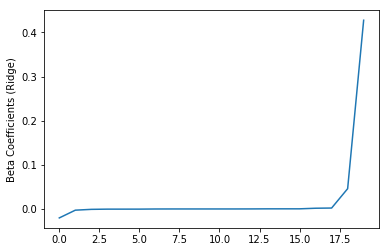

In [32]:
beta_ridge=np.sort(lr_ridgeModel.coefficients)
plt.plot(beta_ridge)
plt.ylabel('Beta Coefficients (Ridge)')
plt.show()

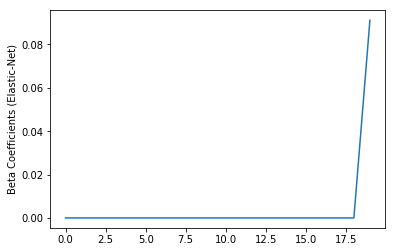

In [34]:
beta_ElasticNet=np.sort(lr_ElasticNetModel.coefficients)
plt.plot(beta_ElasticNet)
plt.ylabel('Beta Coefficients (Elastic-Net)')
plt.show()

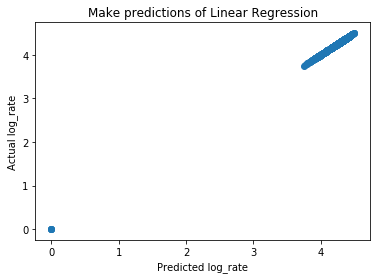

In [35]:
plt.scatter(x=predictions_lr.toPandas()["prediction"],y=predictions_lr.toPandas()["log_rate"])
plt.title('Make predictions of Linear Regression')
plt.xlabel('Predicted log_rate')
plt.ylabel('Actual log_rate')
plt.show()

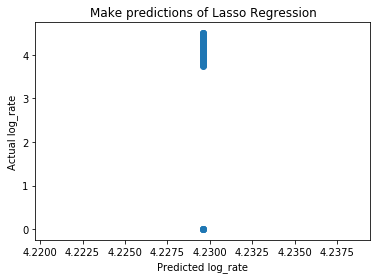

In [36]:
plt.scatter(x=predictions_lasso.toPandas()["prediction"],y=predictions_lasso.toPandas()["log_rate"])
plt.title('Make predictions of Lasso Regression')
plt.xlabel('Predicted log_rate')
plt.ylabel('Actual log_rate')
plt.show()

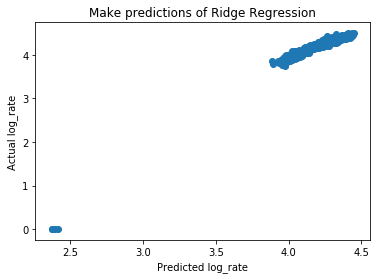

In [37]:
plt.scatter(x=predictions_ridge.toPandas()["prediction"],y=predictions_ridge.toPandas()["log_rate"])
plt.title('Make predictions of Ridge Regression')
plt.xlabel('Predicted log_rate')
plt.ylabel('Actual log_rate')
plt.show()

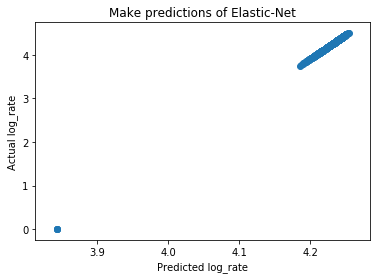

In [38]:
plt.scatter(x=predictions_ElasticNet.toPandas()["prediction"],y=predictions_ElasticNet.toPandas()["log_rate"])
plt.title('Make predictions of Elastic-Net')
plt.xlabel('Predicted log_rate')
plt.ylabel('Actual log_rate')
plt.show()